In [29]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np 
import pandas as pd

import scipy.stats as scs 
import statsmodels.api as sm
import requests
import urllib
import time
import pickle


from sklearn.linear_model import LinearRegression, Ridge, Lasso 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold
from statsmodels.stats.power import TTestIndPower, TTestPower, tt_ind_solve_power

from IPython.core.display import HTML
from IPython.display import IFrame
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsFunctions as sf
import plotly.offline as pyo
import openbrewerydb
from geopy import distance
import pickle

pyo.init_notebook_mode()
%matplotlib inline

## Exploring housing options based on travel time to work.

The dataset only included lat/lon coordinates of houses within King County. Using QGIS, I was able to find and import a road map dataset to use as a layer along with the housing information. From there I did a network analysis by taking each house and calculating the time of the fastest route within Seattles roadways averaging 50km/h to arive at the University of Washington Medical Center. I then joined that time data to my original dataset and exported it from the platform.

In [30]:
df = pd.read_csv('../data/cleaned_with_water_and_path.csv')

In [31]:
# Eliminating housing options outside of these lat/lon bounds due to the network (street map) data used to process fastest travel times did not include these areas.
df = df[df['lat'] > 47.45]
df = df[df['long'] < -122.215]

In [32]:
# path_cost was a column I joined to my main dataset from within QGIS. This feature displays time in hours so I transformed it into minutes by multiplying by 60.
df['travel_time'] = df['path_cost'].apply(lambda x:x*60)

In [33]:
fig = px.scatter_mapbox(df, 
                        lat="lat", 
                        lon="long", 
                        color="travel_time", 
                        size="price",
                        size_max=7, 
                        zoom=10)

fig.update_layout(
    title='Travel Time in Minutes to UW Medical Center',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    width=1000, 
    height=1000,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.335
        ),
        pitch=0,
        zoom=10.7,
        style='dark',
    ),
)
fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        showlegend=False,
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
                                size=12,
                                color='rgb(191, 96, 64)',
                                opacity=0.5
                            ),
        name="University of Washington Medical Center"
    ))


fig.show()

## Question 1 - What are the housing options that are a 10 minute drive away from my wife's work?

Nobody likes a commute! Since I primarily work from home, my commute is measured more in a distance of feet rather than miles. My wife however prefers to live relatively close to work so she can respond quickly while on call and would prefer to be close enough to walk or ride a bike to work as a way to destress before or after a hard shift. 

In [34]:
# Creating a new dataframe containing only houses within 10 minutes and removing data points with innaccurate network data
df_10min = df[(df.travel_time <= 10) & (df.long < -122.261)]

In [35]:
fig = px.scatter_mapbox(df_10min, lat="lat", 
                        lon="long", 
                        color="travel_time", 
                        size="price",
                        size_max=7, 
                        zoom=10)

fig.update_layout(
    title='Travel Time in Minutes to UW Medical Center',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    width=1000, 
    height=1000,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.64,
            lon=-122.3245
        ),
        pitch=0,
        zoom=11.0,
        style='dark',
    ),
)
fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        showlegend=False,
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),

        name="University of Washington Medical Center"
    ))

fig.show()

## Conclusion 1

Great! Based on the homes within the map above we've got a separate dataframe full of houses that are within 10 minutes away from the hospital. Even though we're open to that distance, the closer to work for her the better. I'm not too familiar with the Ravenna or Laurelhurst neighborhoods but based on the map it seems like the homes in Larelhurst are much more expensive than Ravenna and also Wallingford which might cause us to lean to those areas more.  

## Question 2 - What homes are within 2 miles of a few of my favorite breweries in Seattle?

Now that my wife is covered, I want to see which of these are close by to some of my favorite breweries in Seattle. We both enjoy eating out and trying new restuarants and breweries and many of the breweries are located within cool parts of town that we tend to find ourselves in anyways so if we can find a home that is both close to her work and in a part of town that we enjoy that would be ideal! 

The breweries I picked were completely based off of personal preference. We've shared many memories at these locations or with the products that they've offered and when we think about when we used to live in Seattle, taprooms and beer gardens are where we see ourselves. Except for Optimism. Their beer kinda sucks but they have a beautiful space. Honestly I only chose that because I felt like I had to represent the Cap hill neighborhood and wanted to stick with "breweries" and not drift off to "bars" or "taprooms; otherwise, Pine Box would've been the move.

In [36]:
# read in data with brewery distance feature
with open('../data/brew_radi_df.pkl', 'rb') as f:
    brew_radi_df = pickle.load(f)

In [37]:
# read in brewery location data
with open('../data/breweries.pkl', 'rb') as f:
    breweries = pickle.load(f)

In [38]:
fig = px.scatter_mapbox(brew_radi_df, lat="lat", 
                        lon="long", 
                        color="closest_dist", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        showlegend=False,
        name='Breweries',
        marker=go.scattermapbox.Marker(
                                size=12,
                                color='rgb(191, 96, 64)',
                                opacity=0.7
                            ),    
                        ))

fig.update_layout(
    title='Homes within 2 miles of favorite Seattle Breweries',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    width=1000, 
    height=700,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.642,
            lon=-122.35
        ),
        pitch=0,
        zoom=11.2,
        style='dark'
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        showlegend=False,
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),
        name="University of Washington Medical Center"
    )
)

fig.show()

## Conclusion 2

Good thing that the hospital is located where it is! It looks like there's plenty of overlap in houses that fall within both 10 minutes of driving distance to the hospital and a 2 mile radius of some of my favorite breweries! Based on these maps and only these two variables, it seems like the we'd try to look for a house in the Fremont or Wallingford neighborhoods, which actually falls in line to where we'd like to be! 

The hospital is located in the University District which is filled with student housing and not exactly a place we want to live at this point in our lives. Fremont is kind of a trendy/artsy neighborhood with fantastic food and drink options for us to enjoy!

## Question 3 - Does a house position within 1/4 mile of the water affect the price of homes?

With so much water around Seattle, I would imagine there are several properties that would qualify as "waterfront properties". I wanted to know if being close to the water had a significant impact on the price. The given dataset included a "waterfront" column marked with 1's or 0's to denote if a home is or is not a waterfront property respectively. After exploring the data, I realized that there seems to be an inconsistency within the data. The data doesn't seem to properly reflect homes that are on the waterfront, and seems to be missing quite a few - as shown below.

In [39]:
# reloading original dataframe
df = pd.read_csv('../data/cleaned_with_water_and_path.csv')

In [40]:
fig = px.scatter_mapbox(df, lat="lat", 
                        lon="long", 
                        color="waterfront", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        showlegend=False,
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),
    )
)

fig.update_layout(
    title='Current Representation of Waterfront Properties',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    height=1000,
    width=700,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        pitch=0,
        zoom=9.2,
        style='dark',
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        showlegend=False,
        name="University of Washington Medical Center",
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),
    )
)

fig.show()

In [41]:
df.waterfront.sum()

28

Based on the map and results above, there are only 28 seemingly correctly labeled waterfront properties. It seems like the data is missing several other properties along the waterfront that should be labeled as a waterfront property but are not. 

To identify the waterfront properties, I found datasets to represent the bodies of water around Seattle and used that to identify the distance in miles from each house to the closest large body of water. Below we'll plot the same points but display their color based on their proximity to the waterfront. (Note - Only large bodies of water are considered. Small ponds and other lakes mainly towards the East and South East were removed during processing in QGIS)

In [42]:
fig = px.scatter_mapbox(df, lat="lat", 
                        lon="long", 
                        color="water_dist", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        showlegend=False,
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),
    )
)

fig.update_layout(
    title='Properties Presented by Proximity to Water',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    height=1000,
    width=700,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        pitch=0,
        zoom=9.2,
        style='dark',
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        showlegend=False,
        name="University of Washington Medical Center",
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),
    )
)

fig.show()

This map isn't the most informative. There's so much water around the Seattle area that the vast majority of homes are within 5 miles and so most of the homes are colored dark blue. Let's define waterfront as being within 1/4 mile away from the shore and rebuild our map based on this metric.

In [43]:
df['within_quarter'] = df['water_dist'].apply(lambda x: 1.0 if x <= 0.25 else 0.0)
df.within_quarter

0        0.0
1        0.0
2        1.0
3        0.0
4        0.0
        ... 
15381    0.0
15382    0.0
15383    0.0
15384    0.0
15385    0.0
Name: within_quarter, Length: 15386, dtype: float64

In [44]:
df.within_quarter.value_counts()

0.0    14237
1.0     1149
Name: within_quarter, dtype: int64

In [45]:
fig = px.scatter_mapbox(df, lat="lat", 
                        lon="long", 
                        color="within_quarter", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        showlegend=False,
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),
    )
)

fig.update_layout(
    title='Waterfront Properties based on a 1/4 mile Threshold',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    width=1000,
    height=800,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        pitch=0,
        zoom=10.2,
        style='dark',
        center=dict(
            lat=47.61,
            lon=-122.22
        ),
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        showlegend=False,
        name="University of Washington Medical Center",
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),
    )
)

fig.show()

Much better. Now our data more accurately represents what is and isn't a waterfront property and we can also zoom in and visually inspect some information about each home. Just browing the map it does look like that houses along the waterfront tend to be more expensive than those more inland. However there are exceptions to that most notably around the Lower Queen Anne, Capitol Hill, and Ashwood neigborhoods. Off of memory I know that Queen Anne is very close to South Lake Union which is where the Amazon headquarters is, Capitol Hill is a very trendy and busy part of town, and Ashwood is relatively close to where Microsofts headquarters is it makes a bit of sense to me that these areas might have more expensive homes. 

Now let's see if being 1/4 mile away from the water actually has any significant affect on price.

Null Hypothesis is that the mean of the sampling distribution of prices gathered from both waterfront propeties and non-waterfront properties are the same

H0: mu_waterfront = mu_nonwaterfront

Alternative Hypothesis is that the mean of the sampling distribution of prices gathered from waterfront properties is different than the mean of the sampling distribution of prices gathered from non-waterfront properties

HA: mu_waterfront != mu_nonwaterfront

In [46]:
wfront = df.loc[df.water_dist <= 0.25, 'price']
nonwfront = df.loc[df.water_dist > 0.25, 'price']

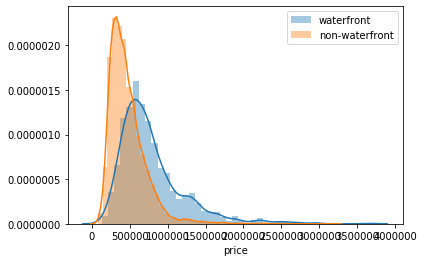

In [47]:
# inspect distributions of waterfront and non-waterfront homes based on price
sns.distplot(wfront, label='waterfront')
sns.distplot(nonwfront, label='non-waterfront')
plt.legend();

In [48]:
# testing for normality via a Shapiro test. The second value is our p-value and a p-value of less than 0.05 means that we reject the null hypothesis that our distribution is normal.
scs.shapiro(wfront), scs.shapiro(nonwfront)

((0.8497222065925598, 1.1459262010205739e-31), (0.8361132144927979, 0.0))

In [49]:
# because our distributions are not normal, we need to generate sample means from each distribution and test for normality of those sample means
sample_mus_wfront = sf.generate_sample_mus(wfront)
sample_mus_nonwfront = sf.generate_sample_mus(nonwfront)

In [50]:
sf.test_for_normality(sample_mus_wfront), sf.test_for_normality(sample_mus_nonwfront)

fail to reject the null
fail to reject the null


(True, True)

In [51]:
# check our hypotheses
scs.ttest_ind(sample_mus_wfront, sample_mus_nonwfront, equal_var=False)

Ttest_indResult(statistic=115.80660420903678, pvalue=6.377067821865821e-42)

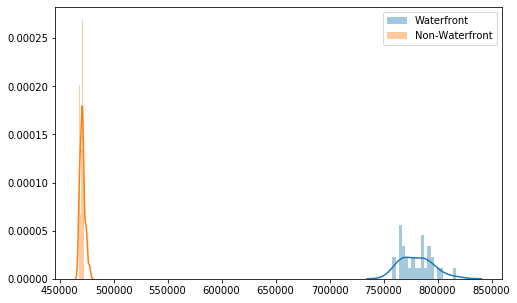

In [52]:
plt.figure(figsize=(8, 5))
sns.distplot(sample_mus_wfront, label="Waterfront", bins=20)
sns.distplot(sample_mus_nonwfront, label="Non-Waterfront", bins=20)
plt.legend()
plt.show()

In [53]:
effect_size = sf.cohens_d(sample_mus_wfront, sample_mus_nonwfront)
effect_size

29.90113663216221

In [54]:
power = tt_ind_solve_power(effect_size=effect_size,
                           nobs1=len(sample_mus_wfront),
                           alpha=0.05)
power

1.0

## Conclusion 3

The mean of the sampling distribution of prices gathered from waterfront and non-waterfront homes are different. This test proves that a house located within 1/4 mile from the water does have an affect on price